# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [20]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of time series forecasting (cnn) without any normalization and with minimum bridge data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [7]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [9]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [10]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [11]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [12]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [13]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [14]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [15]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [16]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [17]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [18]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [19]:
# Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
flat1 = tf.keras.layers.Flatten()(pool1)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
flat2 = tf.keras.layers.Flatten()(pool2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
flat3 = tf.keras.layers.Flatten()(pool3)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
flat4 = tf.keras.layers.Flatten()(pool4)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
flat5 = tf.keras.layers.Flatten()(pool5)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
flat6 = tf.keras.layers.Flatten()(pool6)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=10, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_model.summary())

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [21]:
from tensorflow import keras

multi_channel_cnn_model.compile(loss='mae', optimizer='adam')

# Train model

In [22]:
history = multi_channel_cnn_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 295.4163 - val_loss: 403.0349
Epoch 2/2000
10/10 - 0s - loss: 124.0802 - val_loss: 242.5302
Epoch 3/2000
10/10 - 0s - loss: 58.0650 - val_loss: 64.2357
Epoch 4/2000
10/10 - 0s - loss: 38.7257 - val_loss: 67.6359
Epoch 5/2000
10/10 - 0s - loss: 39.0844 - val_loss: 64.1560
Epoch 6/2000
10/10 - 0s - loss: 36.2181 - val_loss: 40.6401
Epoch 7/2000
10/10 - 0s - loss: 31.0623 - val_loss: 59.4409
Epoch 8/2000
10/10 - 0s - loss: 29.4668 - val_loss: 40.1427
Epoch 9/2000
10/10 - 0s - loss: 27.6711 - val_loss: 50.8191
Epoch 10/2000
10/10 - 0s - loss: 25.7472 - val_loss: 30.7604
Epoch 11/2000
10/10 - 0s - loss: 23.7788 - val_loss: 51.4521
Epoch 12/2000
10/10 - 0s - loss: 27.3030 - val_loss: 33.3102
Epoch 13/2000
10/10 - 0s - loss: 23.5995 - val_loss: 32.4265
Epoch 14/2000
10/10 - 0s - loss: 23.0941 - val_loss: 22.0244
Epoch 15/2000
10/10 - 0s - loss: 23.6151 - val_loss: 53.4725
Epoch 16/2000
10/10 - 0s - loss: 23.9495 - val_loss: 54.0168
Epoch 17/2000
10/10 - 0s - lo

Epoch 137/2000
10/10 - 0s - loss: 6.2799 - val_loss: 28.7275
Epoch 138/2000
10/10 - 0s - loss: 5.4927 - val_loss: 23.1215
Epoch 139/2000
10/10 - 0s - loss: 5.8400 - val_loss: 26.3969
Epoch 140/2000
10/10 - 0s - loss: 6.0118 - val_loss: 28.0588
Epoch 141/2000
10/10 - 0s - loss: 5.4786 - val_loss: 24.4176
Epoch 142/2000
10/10 - 0s - loss: 5.4236 - val_loss: 24.7186
Epoch 143/2000
10/10 - 0s - loss: 5.6680 - val_loss: 24.4095
Epoch 144/2000
10/10 - 0s - loss: 5.5718 - val_loss: 27.5796
Epoch 145/2000
10/10 - 0s - loss: 5.7340 - val_loss: 23.8192
Epoch 146/2000
10/10 - 0s - loss: 5.8992 - val_loss: 24.4465
Epoch 147/2000
10/10 - 0s - loss: 5.5243 - val_loss: 26.3237
Epoch 148/2000
10/10 - 0s - loss: 5.8039 - val_loss: 26.4976
Epoch 149/2000
10/10 - 0s - loss: 5.3740 - val_loss: 24.3595
Epoch 150/2000
10/10 - 0s - loss: 5.0991 - val_loss: 25.7628
Epoch 151/2000
10/10 - 0s - loss: 5.6879 - val_loss: 25.1751
Epoch 152/2000
10/10 - 0s - loss: 5.4726 - val_loss: 28.7421
Epoch 153/2000
10/10 - 0

Epoch 272/2000
10/10 - 0s - loss: 4.8825 - val_loss: 25.5122
Epoch 273/2000
10/10 - 0s - loss: 5.0309 - val_loss: 26.1231
Epoch 274/2000
10/10 - 0s - loss: 4.8180 - val_loss: 25.6527
Epoch 275/2000
10/10 - 0s - loss: 4.9784 - val_loss: 24.6392
Epoch 276/2000
10/10 - 0s - loss: 5.1726 - val_loss: 26.3585
Epoch 277/2000
10/10 - 0s - loss: 5.2960 - val_loss: 27.9112
Epoch 278/2000
10/10 - 0s - loss: 4.8282 - val_loss: 25.9634
Epoch 279/2000
10/10 - 0s - loss: 4.9597 - val_loss: 23.7736
Epoch 280/2000
10/10 - 0s - loss: 5.1840 - val_loss: 26.9303
Epoch 281/2000
10/10 - 0s - loss: 4.9851 - val_loss: 26.4501
Epoch 282/2000
10/10 - 0s - loss: 5.0165 - val_loss: 27.1469
Epoch 283/2000
10/10 - 0s - loss: 4.7186 - val_loss: 25.0473
Epoch 284/2000
10/10 - 0s - loss: 4.8845 - val_loss: 24.9824
Epoch 285/2000
10/10 - 0s - loss: 4.8788 - val_loss: 24.3083
Epoch 286/2000
10/10 - 0s - loss: 5.2194 - val_loss: 27.9134
Epoch 287/2000
10/10 - 0s - loss: 5.2764 - val_loss: 27.8566
Epoch 288/2000
10/10 - 0

Epoch 407/2000
10/10 - 0s - loss: 4.8545 - val_loss: 26.5829
Epoch 408/2000
10/10 - 0s - loss: 5.0259 - val_loss: 28.8090
Epoch 409/2000
10/10 - 0s - loss: 5.1983 - val_loss: 28.8845
Epoch 410/2000
10/10 - 0s - loss: 4.8153 - val_loss: 27.0778
Epoch 411/2000
10/10 - 0s - loss: 4.7391 - val_loss: 26.3087
Epoch 412/2000
10/10 - 0s - loss: 4.7042 - val_loss: 26.3839
Epoch 413/2000
10/10 - 0s - loss: 4.7609 - val_loss: 27.4228
Epoch 414/2000
10/10 - 0s - loss: 4.9868 - val_loss: 27.8917
Epoch 415/2000
10/10 - 0s - loss: 4.6508 - val_loss: 29.0704
Epoch 416/2000
10/10 - 0s - loss: 4.4903 - val_loss: 28.6392
Epoch 417/2000
10/10 - 0s - loss: 4.6578 - val_loss: 28.7906
Epoch 418/2000
10/10 - 0s - loss: 4.7356 - val_loss: 28.0201
Epoch 419/2000
10/10 - 0s - loss: 4.5692 - val_loss: 26.5550
Epoch 420/2000
10/10 - 0s - loss: 5.3387 - val_loss: 26.8890
Epoch 421/2000
10/10 - 0s - loss: 5.1238 - val_loss: 29.4741
Epoch 422/2000
10/10 - 0s - loss: 4.9413 - val_loss: 29.4633
Epoch 423/2000
10/10 - 0

Epoch 542/2000
10/10 - 0s - loss: 4.7671 - val_loss: 30.5417
Epoch 543/2000
10/10 - 0s - loss: 4.2486 - val_loss: 30.5151
Epoch 544/2000
10/10 - 0s - loss: 4.4930 - val_loss: 32.1604
Epoch 545/2000
10/10 - 0s - loss: 4.2234 - val_loss: 31.5325
Epoch 546/2000
10/10 - 0s - loss: 4.1030 - val_loss: 31.1460
Epoch 547/2000
10/10 - 0s - loss: 4.3018 - val_loss: 29.6469
Epoch 548/2000
10/10 - 0s - loss: 4.2951 - val_loss: 30.1988
Epoch 549/2000
10/10 - 0s - loss: 4.3280 - val_loss: 31.0153
Epoch 550/2000
10/10 - 0s - loss: 4.0965 - val_loss: 31.0289
Epoch 551/2000
10/10 - 0s - loss: 4.2835 - val_loss: 30.1042
Epoch 552/2000
10/10 - 0s - loss: 4.2100 - val_loss: 30.4034
Epoch 553/2000
10/10 - 0s - loss: 4.1368 - val_loss: 30.5687
Epoch 554/2000
10/10 - 0s - loss: 3.9786 - val_loss: 30.8802
Epoch 555/2000
10/10 - 0s - loss: 4.0626 - val_loss: 30.8287
Epoch 556/2000
10/10 - 0s - loss: 4.4863 - val_loss: 30.3444
Epoch 557/2000
10/10 - 0s - loss: 4.6815 - val_loss: 31.0339
Epoch 558/2000
10/10 - 0

Epoch 677/2000
10/10 - 0s - loss: 3.9592 - val_loss: 29.9026
Epoch 678/2000
10/10 - 0s - loss: 4.3779 - val_loss: 30.4980
Epoch 679/2000
10/10 - 0s - loss: 4.0139 - val_loss: 31.7019
Epoch 680/2000
10/10 - 0s - loss: 4.0048 - val_loss: 31.9800
Epoch 681/2000
10/10 - 0s - loss: 3.7524 - val_loss: 30.2006
Epoch 682/2000
10/10 - 0s - loss: 4.1198 - val_loss: 30.1852
Epoch 683/2000
10/10 - 0s - loss: 3.9735 - val_loss: 29.7213
Epoch 684/2000
10/10 - 0s - loss: 4.1118 - val_loss: 30.5259
Epoch 685/2000
10/10 - 0s - loss: 3.8111 - val_loss: 32.3690
Epoch 686/2000
10/10 - 0s - loss: 3.8778 - val_loss: 31.7222
Epoch 687/2000
10/10 - 0s - loss: 4.1374 - val_loss: 30.8699
Epoch 688/2000
10/10 - 0s - loss: 4.0876 - val_loss: 31.0356
Epoch 689/2000
10/10 - 0s - loss: 3.8475 - val_loss: 31.9688
Epoch 690/2000
10/10 - 0s - loss: 4.1300 - val_loss: 32.3701
Epoch 691/2000
10/10 - 0s - loss: 4.1602 - val_loss: 32.3207
Epoch 692/2000
10/10 - 0s - loss: 3.7187 - val_loss: 32.0606
Epoch 693/2000
10/10 - 0

Epoch 812/2000
10/10 - 0s - loss: 3.4102 - val_loss: 31.9883
Epoch 813/2000
10/10 - 0s - loss: 3.6362 - val_loss: 32.1579
Epoch 814/2000
10/10 - 0s - loss: 3.7180 - val_loss: 31.6316
Epoch 815/2000
10/10 - 0s - loss: 3.4858 - val_loss: 31.2677
Epoch 816/2000
10/10 - 0s - loss: 3.6416 - val_loss: 30.8809
Epoch 817/2000
10/10 - 0s - loss: 3.4262 - val_loss: 30.8195
Epoch 818/2000
10/10 - 0s - loss: 3.6569 - val_loss: 31.6165
Epoch 819/2000
10/10 - 0s - loss: 3.5020 - val_loss: 32.0586
Epoch 820/2000
10/10 - 0s - loss: 3.4727 - val_loss: 31.5861
Epoch 821/2000
10/10 - 0s - loss: 3.6514 - val_loss: 31.2020
Epoch 822/2000
10/10 - 0s - loss: 3.6117 - val_loss: 31.3438
Epoch 823/2000
10/10 - 0s - loss: 3.4137 - val_loss: 32.5134
Epoch 824/2000
10/10 - 0s - loss: 3.6370 - val_loss: 31.1548
Epoch 825/2000
10/10 - 0s - loss: 3.6662 - val_loss: 30.4410
Epoch 826/2000
10/10 - 0s - loss: 3.6911 - val_loss: 30.8337
Epoch 827/2000
10/10 - 0s - loss: 3.4481 - val_loss: 31.4106
Epoch 828/2000
10/10 - 0

Epoch 947/2000
10/10 - 0s - loss: 3.3388 - val_loss: 30.6892
Epoch 948/2000
10/10 - 0s - loss: 3.0911 - val_loss: 30.1781
Epoch 949/2000
10/10 - 0s - loss: 3.6626 - val_loss: 31.5547
Epoch 950/2000
10/10 - 0s - loss: 3.2935 - val_loss: 31.4679
Epoch 951/2000
10/10 - 0s - loss: 3.2499 - val_loss: 30.7647
Epoch 952/2000
10/10 - 0s - loss: 3.1909 - val_loss: 29.5473
Epoch 953/2000
10/10 - 0s - loss: 3.4592 - val_loss: 28.4501
Epoch 954/2000
10/10 - 0s - loss: 3.4109 - val_loss: 28.7127
Epoch 955/2000
10/10 - 0s - loss: 3.4238 - val_loss: 28.5272
Epoch 956/2000
10/10 - 0s - loss: 3.4488 - val_loss: 29.7911
Epoch 957/2000
10/10 - 0s - loss: 3.1451 - val_loss: 29.5821
Epoch 958/2000
10/10 - 0s - loss: 3.2163 - val_loss: 28.8247
Epoch 959/2000
10/10 - 0s - loss: 3.3631 - val_loss: 29.3547
Epoch 960/2000
10/10 - 0s - loss: 3.1673 - val_loss: 28.8830
Epoch 961/2000
10/10 - 0s - loss: 3.5328 - val_loss: 28.1750
Epoch 962/2000
10/10 - 0s - loss: 3.2151 - val_loss: 28.6378
Epoch 963/2000
10/10 - 0

Epoch 1080/2000
10/10 - 0s - loss: 3.1913 - val_loss: 31.0167
Epoch 1081/2000
10/10 - 0s - loss: 3.0609 - val_loss: 29.0266
Epoch 1082/2000
10/10 - 0s - loss: 3.4719 - val_loss: 29.3614
Epoch 1083/2000
10/10 - 0s - loss: 3.2480 - val_loss: 30.0741
Epoch 1084/2000
10/10 - 0s - loss: 3.3558 - val_loss: 30.5349
Epoch 1085/2000
10/10 - 0s - loss: 3.1440 - val_loss: 30.1961
Epoch 1086/2000
10/10 - 0s - loss: 2.9989 - val_loss: 29.9034
Epoch 1087/2000
10/10 - 0s - loss: 3.1996 - val_loss: 29.2729
Epoch 1088/2000
10/10 - 0s - loss: 3.1111 - val_loss: 28.9088
Epoch 1089/2000
10/10 - 0s - loss: 3.6015 - val_loss: 30.2459
Epoch 1090/2000
10/10 - 0s - loss: 3.3558 - val_loss: 30.4614
Epoch 1091/2000
10/10 - 0s - loss: 3.2126 - val_loss: 28.9904
Epoch 1092/2000
10/10 - 0s - loss: 3.4559 - val_loss: 29.4814
Epoch 1093/2000
10/10 - 0s - loss: 3.2017 - val_loss: 29.9530
Epoch 1094/2000
10/10 - 0s - loss: 3.1108 - val_loss: 30.0683
Epoch 1095/2000
10/10 - 0s - loss: 3.5229 - val_loss: 29.6238
Epoch 10

Epoch 1213/2000
10/10 - 0s - loss: 3.2593 - val_loss: 30.0614
Epoch 1214/2000
10/10 - 0s - loss: 3.0209 - val_loss: 29.7378
Epoch 1215/2000
10/10 - 0s - loss: 3.1515 - val_loss: 30.6482
Epoch 1216/2000
10/10 - 0s - loss: 3.2425 - val_loss: 30.9615
Epoch 1217/2000
10/10 - 0s - loss: 2.9562 - val_loss: 31.5552
Epoch 1218/2000
10/10 - 0s - loss: 3.4214 - val_loss: 32.3834
Epoch 1219/2000
10/10 - 0s - loss: 3.4620 - val_loss: 32.8362
Epoch 1220/2000
10/10 - 0s - loss: 2.9537 - val_loss: 33.0183
Epoch 1221/2000
10/10 - 0s - loss: 3.0719 - val_loss: 34.0167
Epoch 1222/2000
10/10 - 0s - loss: 3.1404 - val_loss: 32.9554
Epoch 1223/2000
10/10 - 0s - loss: 3.2661 - val_loss: 32.8928
Epoch 1224/2000
10/10 - 0s - loss: 3.1677 - val_loss: 33.9189
Epoch 1225/2000
10/10 - 0s - loss: 3.2044 - val_loss: 33.2655
Epoch 1226/2000
10/10 - 0s - loss: 3.0857 - val_loss: 33.6002
Epoch 1227/2000
10/10 - 0s - loss: 3.2883 - val_loss: 33.2688
Epoch 1228/2000
10/10 - 0s - loss: 3.2109 - val_loss: 32.0857
Epoch 12

Epoch 1346/2000
10/10 - 0s - loss: 3.1447 - val_loss: 28.9888
Epoch 1347/2000
10/10 - 0s - loss: 2.9650 - val_loss: 28.5251
Epoch 1348/2000
10/10 - 0s - loss: 3.1833 - val_loss: 29.1864
Epoch 1349/2000
10/10 - 0s - loss: 3.4702 - val_loss: 30.8428
Epoch 1350/2000
10/10 - 0s - loss: 3.3565 - val_loss: 31.5861
Epoch 1351/2000
10/10 - 0s - loss: 3.0973 - val_loss: 31.4815
Epoch 1352/2000
10/10 - 0s - loss: 3.1004 - val_loss: 30.9524
Epoch 1353/2000
10/10 - 0s - loss: 3.1012 - val_loss: 30.7535
Epoch 1354/2000
10/10 - 0s - loss: 3.4771 - val_loss: 30.1923
Epoch 1355/2000
10/10 - 0s - loss: 3.2424 - val_loss: 30.4143
Epoch 1356/2000
10/10 - 0s - loss: 3.0277 - val_loss: 30.8520
Epoch 1357/2000
10/10 - 0s - loss: 3.0990 - val_loss: 30.9239
Epoch 1358/2000
10/10 - 0s - loss: 3.0382 - val_loss: 31.3397
Epoch 1359/2000
10/10 - 0s - loss: 2.8883 - val_loss: 31.7920
Epoch 1360/2000
10/10 - 0s - loss: 2.9389 - val_loss: 30.9249
Epoch 1361/2000
10/10 - 0s - loss: 3.0864 - val_loss: 30.1425
Epoch 13

10/10 - 0s - loss: 3.2058 - val_loss: 29.4624
Epoch 1479/2000
10/10 - 0s - loss: 3.3171 - val_loss: 29.4530
Epoch 1480/2000
10/10 - 0s - loss: 3.2930 - val_loss: 30.1394
Epoch 1481/2000
10/10 - 0s - loss: 3.1461 - val_loss: 30.7025
Epoch 1482/2000
10/10 - 0s - loss: 2.9105 - val_loss: 29.4136
Epoch 1483/2000
10/10 - 0s - loss: 3.0275 - val_loss: 29.6215
Epoch 1484/2000
10/10 - 0s - loss: 3.1114 - val_loss: 29.0169
Epoch 1485/2000
10/10 - 0s - loss: 3.2476 - val_loss: 30.2779
Epoch 1486/2000
10/10 - 0s - loss: 3.2856 - val_loss: 29.5787
Epoch 1487/2000
10/10 - 0s - loss: 3.0909 - val_loss: 28.7246
Epoch 1488/2000
10/10 - 0s - loss: 3.0747 - val_loss: 29.2269
Epoch 1489/2000
10/10 - 0s - loss: 3.2754 - val_loss: 28.3359
Epoch 1490/2000
10/10 - 0s - loss: 3.4925 - val_loss: 29.4044
Epoch 1491/2000
10/10 - 0s - loss: 3.4056 - val_loss: 29.0768
Epoch 1492/2000
10/10 - 0s - loss: 3.1696 - val_loss: 29.7845
Epoch 1493/2000
10/10 - 0s - loss: 3.1541 - val_loss: 29.9489
Epoch 1494/2000
10/10 - 

Epoch 1611/2000
10/10 - 0s - loss: 3.0366 - val_loss: 29.0963
Epoch 1612/2000
10/10 - 0s - loss: 3.1255 - val_loss: 28.7091
Epoch 1613/2000
10/10 - 0s - loss: 2.9823 - val_loss: 27.3397
Epoch 1614/2000
10/10 - 0s - loss: 3.3893 - val_loss: 27.7073
Epoch 1615/2000
10/10 - 0s - loss: 3.3652 - val_loss: 29.5284
Epoch 1616/2000
10/10 - 0s - loss: 2.9236 - val_loss: 30.6182
Epoch 1617/2000
10/10 - 0s - loss: 3.0899 - val_loss: 30.2854
Epoch 1618/2000
10/10 - 0s - loss: 3.0689 - val_loss: 29.5766
Epoch 1619/2000
10/10 - 0s - loss: 3.0481 - val_loss: 28.9453
Epoch 1620/2000
10/10 - 0s - loss: 2.9972 - val_loss: 28.0753
Epoch 1621/2000
10/10 - 0s - loss: 3.2380 - val_loss: 28.1919
Epoch 1622/2000
10/10 - 0s - loss: 3.0222 - val_loss: 28.6089
Epoch 1623/2000
10/10 - 0s - loss: 2.9481 - val_loss: 28.5382
Epoch 1624/2000
10/10 - 0s - loss: 3.2055 - val_loss: 28.4374
Epoch 1625/2000
10/10 - 0s - loss: 3.2871 - val_loss: 28.8488
Epoch 1626/2000
10/10 - 0s - loss: 2.9631 - val_loss: 29.9946
Epoch 16

Epoch 1744/2000
10/10 - 0s - loss: 3.3063 - val_loss: 29.7177
Epoch 1745/2000
10/10 - 0s - loss: 3.1254 - val_loss: 30.0729
Epoch 1746/2000
10/10 - 0s - loss: 3.2666 - val_loss: 29.9416
Epoch 1747/2000
10/10 - 0s - loss: 2.8643 - val_loss: 29.4588
Epoch 1748/2000
10/10 - 0s - loss: 3.1821 - val_loss: 28.8607
Epoch 1749/2000
10/10 - 0s - loss: 3.2930 - val_loss: 29.4563
Epoch 1750/2000
10/10 - 0s - loss: 3.2407 - val_loss: 30.7535
Epoch 1751/2000
10/10 - 0s - loss: 3.2614 - val_loss: 31.1029
Epoch 1752/2000
10/10 - 0s - loss: 3.1348 - val_loss: 31.0585
Epoch 1753/2000
10/10 - 0s - loss: 3.0808 - val_loss: 30.4944
Epoch 1754/2000
10/10 - 0s - loss: 3.1013 - val_loss: 29.4514
Epoch 1755/2000
10/10 - 0s - loss: 3.1943 - val_loss: 29.2366
Epoch 1756/2000
10/10 - 0s - loss: 2.9143 - val_loss: 30.0905
Epoch 1757/2000
10/10 - 0s - loss: 3.1588 - val_loss: 29.5090
Epoch 1758/2000
10/10 - 0s - loss: 3.6841 - val_loss: 29.0086
Epoch 1759/2000
10/10 - 0s - loss: 3.2539 - val_loss: 29.7386
Epoch 17

10/10 - 0s - loss: 2.9857 - val_loss: 27.0912
Epoch 1877/2000
10/10 - 0s - loss: 2.8628 - val_loss: 27.3275
Epoch 1878/2000
10/10 - 0s - loss: 2.9156 - val_loss: 28.8214
Epoch 1879/2000
10/10 - 0s - loss: 3.0206 - val_loss: 28.4113
Epoch 1880/2000
10/10 - 0s - loss: 3.0608 - val_loss: 27.5358
Epoch 1881/2000
10/10 - 0s - loss: 3.1956 - val_loss: 28.8426
Epoch 1882/2000
10/10 - 0s - loss: 2.9064 - val_loss: 28.2588
Epoch 1883/2000
10/10 - 0s - loss: 2.9080 - val_loss: 29.1149
Epoch 1884/2000
10/10 - 0s - loss: 2.9108 - val_loss: 29.4298
Epoch 1885/2000
10/10 - 0s - loss: 3.3630 - val_loss: 28.4331
Epoch 1886/2000
10/10 - 0s - loss: 3.2257 - val_loss: 28.6080
Epoch 1887/2000
10/10 - 0s - loss: 3.1371 - val_loss: 29.9084
Epoch 1888/2000
10/10 - 0s - loss: 3.2490 - val_loss: 30.3481
Epoch 1889/2000
10/10 - 0s - loss: 2.9948 - val_loss: 30.7789
Epoch 1890/2000
10/10 - 0s - loss: 2.9190 - val_loss: 30.7102
Epoch 1891/2000
10/10 - 0s - loss: 3.1797 - val_loss: 31.9733
Epoch 1892/2000
10/10 - 

# Plot model loss and validation loss

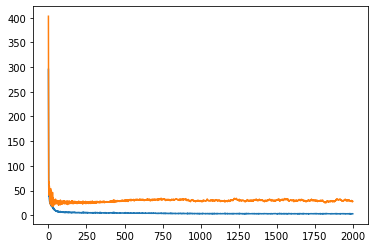

In [23]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [25]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [26]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 28.20340675203687


# Make predictions based on test set and get a root mean squared error 

In [27]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [28]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 33.559410924020334


# Plot train labels along with train predictions

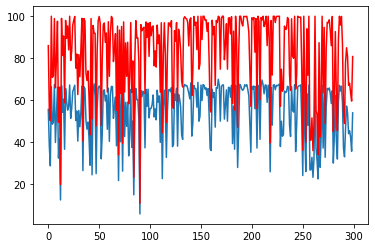

In [29]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

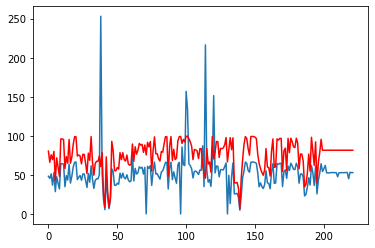

In [30]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [31]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [32]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [33]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [34]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [35]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [36]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [37]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [38]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [39]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [40]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [41]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [42]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [43]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [44]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [45]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [46]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [47]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [48]:
# Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
flat1 = tf.keras.layers.Flatten()(pool1)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
flat2 = tf.keras.layers.Flatten()(pool2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
flat3 = tf.keras.layers.Flatten()(pool3)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
flat4 = tf.keras.layers.Flatten()(pool4)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
flat5 = tf.keras.layers.Flatten()(pool5)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
flat6 = tf.keras.layers.Flatten()(pool6)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=10, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_norm_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_norm_model.summary())

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [49]:
from tensorflow import keras

multi_channel_cnn_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [50]:
history = multi_channel_cnn_norm_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 0.4728 - val_loss: 0.2037
Epoch 2/2000
10/10 - 0s - loss: 0.3406 - val_loss: 0.3547
Epoch 3/2000
10/10 - 0s - loss: 0.2568 - val_loss: 0.2030
Epoch 4/2000
10/10 - 0s - loss: 0.2135 - val_loss: 0.2655
Epoch 5/2000
10/10 - 0s - loss: 0.1849 - val_loss: 0.1951
Epoch 6/2000
10/10 - 0s - loss: 0.1658 - val_loss: 0.2039
Epoch 7/2000
10/10 - 0s - loss: 0.1560 - val_loss: 0.2090
Epoch 8/2000
10/10 - 0s - loss: 0.1546 - val_loss: 0.1817
Epoch 9/2000
10/10 - 0s - loss: 0.1591 - val_loss: 0.1766
Epoch 10/2000
10/10 - 0s - loss: 0.1590 - val_loss: 0.1928
Epoch 11/2000
10/10 - 0s - loss: 0.1504 - val_loss: 0.2012
Epoch 12/2000
10/10 - 0s - loss: 0.1498 - val_loss: 0.1875
Epoch 13/2000
10/10 - 0s - loss: 0.1518 - val_loss: 0.1834
Epoch 14/2000
10/10 - 0s - loss: 0.1518 - val_loss: 0.1833
Epoch 15/2000
10/10 - 0s - loss: 0.1509 - val_loss: 0.2061
Epoch 16/2000
10/10 - 0s - loss: 0.1445 - val_loss: 0.2183
Epoch 17/2000
10/10 - 0s - loss: 0.1545 - val_loss: 0.1779
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.1175 - val_loss: 0.2367
Epoch 141/2000
10/10 - 0s - loss: 0.1163 - val_loss: 0.2242
Epoch 142/2000
10/10 - 0s - loss: 0.1277 - val_loss: 0.2012
Epoch 143/2000
10/10 - 0s - loss: 0.1278 - val_loss: 0.2185
Epoch 144/2000
10/10 - 0s - loss: 0.1213 - val_loss: 0.2350
Epoch 145/2000
10/10 - 0s - loss: 0.1238 - val_loss: 0.2197
Epoch 146/2000
10/10 - 0s - loss: 0.1215 - val_loss: 0.2003
Epoch 147/2000
10/10 - 0s - loss: 0.1274 - val_loss: 0.2202
Epoch 148/2000
10/10 - 0s - loss: 0.1167 - val_loss: 0.2255
Epoch 149/2000
10/10 - 0s - loss: 0.1186 - val_loss: 0.2154
Epoch 150/2000
10/10 - 0s - loss: 0.1163 - val_loss: 0.2198
Epoch 151/2000
10/10 - 0s - loss: 0.1160 - val_loss: 0.2123
Epoch 152/2000
10/10 - 0s - loss: 0.1210 - val_loss: 0.2200
Epoch 153/2000
10/10 - 0s - loss: 0.1183 - val_loss: 0.2233
Epoch 154/2000
10/10 - 0s - loss: 0.1169 - val_loss: 0.2182
Epoch 155/2000
10/10 - 0s - loss: 0.1228 - val_loss: 0.2000
Epoch 156/2000
10/10 - 0s - loss: 0.1195

Epoch 277/2000
10/10 - 0s - loss: 0.1108 - val_loss: 0.2053
Epoch 278/2000
10/10 - 0s - loss: 0.1165 - val_loss: 0.2114
Epoch 279/2000
10/10 - 0s - loss: 0.1167 - val_loss: 0.2180
Epoch 280/2000
10/10 - 0s - loss: 0.1125 - val_loss: 0.2136
Epoch 281/2000
10/10 - 0s - loss: 0.1174 - val_loss: 0.2135
Epoch 282/2000
10/10 - 0s - loss: 0.1135 - val_loss: 0.2209
Epoch 283/2000
10/10 - 0s - loss: 0.1123 - val_loss: 0.2275
Epoch 284/2000
10/10 - 0s - loss: 0.1147 - val_loss: 0.2166
Epoch 285/2000
10/10 - 0s - loss: 0.1188 - val_loss: 0.2178
Epoch 286/2000
10/10 - 0s - loss: 0.1139 - val_loss: 0.2147
Epoch 287/2000
10/10 - 0s - loss: 0.1129 - val_loss: 0.2298
Epoch 288/2000
10/10 - 0s - loss: 0.1137 - val_loss: 0.2264
Epoch 289/2000
10/10 - 0s - loss: 0.1101 - val_loss: 0.2252
Epoch 290/2000
10/10 - 0s - loss: 0.1152 - val_loss: 0.2219
Epoch 291/2000
10/10 - 0s - loss: 0.1122 - val_loss: 0.2247
Epoch 292/2000
10/10 - 0s - loss: 0.1153 - val_loss: 0.2127
Epoch 293/2000
10/10 - 0s - loss: 0.1128

Epoch 414/2000
10/10 - 0s - loss: 0.1160 - val_loss: 0.2118
Epoch 415/2000
10/10 - 0s - loss: 0.1086 - val_loss: 0.2265
Epoch 416/2000
10/10 - 0s - loss: 0.1112 - val_loss: 0.2159
Epoch 417/2000
10/10 - 0s - loss: 0.1145 - val_loss: 0.2079
Epoch 418/2000
10/10 - 0s - loss: 0.1113 - val_loss: 0.2161
Epoch 419/2000
10/10 - 0s - loss: 0.1101 - val_loss: 0.2200
Epoch 420/2000
10/10 - 0s - loss: 0.1078 - val_loss: 0.2164
Epoch 421/2000
10/10 - 0s - loss: 0.1130 - val_loss: 0.2054
Epoch 422/2000
10/10 - 0s - loss: 0.1107 - val_loss: 0.2135
Epoch 423/2000
10/10 - 0s - loss: 0.1101 - val_loss: 0.2172
Epoch 424/2000
10/10 - 0s - loss: 0.1099 - val_loss: 0.2283
Epoch 425/2000
10/10 - 0s - loss: 0.1098 - val_loss: 0.2107
Epoch 426/2000
10/10 - 0s - loss: 0.1101 - val_loss: 0.2072
Epoch 427/2000
10/10 - 0s - loss: 0.1099 - val_loss: 0.2299
Epoch 428/2000
10/10 - 0s - loss: 0.1109 - val_loss: 0.2127
Epoch 429/2000
10/10 - 0s - loss: 0.1121 - val_loss: 0.2065
Epoch 430/2000
10/10 - 0s - loss: 0.1147

Epoch 551/2000
10/10 - 0s - loss: 0.1061 - val_loss: 0.2114
Epoch 552/2000
10/10 - 0s - loss: 0.1047 - val_loss: 0.2168
Epoch 553/2000
10/10 - 0s - loss: 0.0987 - val_loss: 0.2120
Epoch 554/2000
10/10 - 0s - loss: 0.1130 - val_loss: 0.2024
Epoch 555/2000
10/10 - 0s - loss: 0.1082 - val_loss: 0.2217
Epoch 556/2000
10/10 - 0s - loss: 0.1013 - val_loss: 0.2181
Epoch 557/2000
10/10 - 0s - loss: 0.1036 - val_loss: 0.2058
Epoch 558/2000
10/10 - 0s - loss: 0.1069 - val_loss: 0.2157
Epoch 559/2000
10/10 - 0s - loss: 0.1007 - val_loss: 0.2281
Epoch 560/2000
10/10 - 0s - loss: 0.1020 - val_loss: 0.2133
Epoch 561/2000
10/10 - 0s - loss: 0.1079 - val_loss: 0.2012
Epoch 562/2000
10/10 - 0s - loss: 0.1086 - val_loss: 0.2045
Epoch 563/2000
10/10 - 0s - loss: 0.0992 - val_loss: 0.2287
Epoch 564/2000
10/10 - 0s - loss: 0.1029 - val_loss: 0.2060
Epoch 565/2000
10/10 - 0s - loss: 0.1014 - val_loss: 0.2065
Epoch 566/2000
10/10 - 0s - loss: 0.1008 - val_loss: 0.2135
Epoch 567/2000
10/10 - 0s - loss: 0.1019

Epoch 688/2000
10/10 - 0s - loss: 0.0992 - val_loss: 0.2049
Epoch 689/2000
10/10 - 0s - loss: 0.0943 - val_loss: 0.2176
Epoch 690/2000
10/10 - 0s - loss: 0.0949 - val_loss: 0.2001
Epoch 691/2000
10/10 - 0s - loss: 0.0924 - val_loss: 0.2078
Epoch 692/2000
10/10 - 0s - loss: 0.0908 - val_loss: 0.2026
Epoch 693/2000
10/10 - 0s - loss: 0.0947 - val_loss: 0.2060
Epoch 694/2000
10/10 - 0s - loss: 0.0928 - val_loss: 0.2094
Epoch 695/2000
10/10 - 0s - loss: 0.0975 - val_loss: 0.1893
Epoch 696/2000
10/10 - 0s - loss: 0.0947 - val_loss: 0.2029
Epoch 697/2000
10/10 - 0s - loss: 0.0930 - val_loss: 0.2029
Epoch 698/2000
10/10 - 0s - loss: 0.0919 - val_loss: 0.1864
Epoch 699/2000
10/10 - 0s - loss: 0.0912 - val_loss: 0.2058
Epoch 700/2000
10/10 - 0s - loss: 0.0988 - val_loss: 0.2079
Epoch 701/2000
10/10 - 0s - loss: 0.0933 - val_loss: 0.2033
Epoch 702/2000
10/10 - 0s - loss: 0.0900 - val_loss: 0.2006
Epoch 703/2000
10/10 - 0s - loss: 0.0913 - val_loss: 0.1950
Epoch 704/2000
10/10 - 0s - loss: 0.0873

Epoch 825/2000
10/10 - 0s - loss: 0.0838 - val_loss: 0.1935
Epoch 826/2000
10/10 - 0s - loss: 0.0811 - val_loss: 0.1878
Epoch 827/2000
10/10 - 0s - loss: 0.0903 - val_loss: 0.1935
Epoch 828/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1894
Epoch 829/2000
10/10 - 0s - loss: 0.0862 - val_loss: 0.1837
Epoch 830/2000
10/10 - 0s - loss: 0.0878 - val_loss: 0.1896
Epoch 831/2000
10/10 - 0s - loss: 0.0841 - val_loss: 0.1962
Epoch 832/2000
10/10 - 0s - loss: 0.0870 - val_loss: 0.1867
Epoch 833/2000
10/10 - 0s - loss: 0.0858 - val_loss: 0.1924
Epoch 834/2000
10/10 - 0s - loss: 0.0845 - val_loss: 0.2010
Epoch 835/2000
10/10 - 0s - loss: 0.0877 - val_loss: 0.1945
Epoch 836/2000
10/10 - 0s - loss: 0.0916 - val_loss: 0.1843
Epoch 837/2000
10/10 - 0s - loss: 0.0926 - val_loss: 0.1948
Epoch 838/2000
10/10 - 0s - loss: 0.0839 - val_loss: 0.2001
Epoch 839/2000
10/10 - 0s - loss: 0.0832 - val_loss: 0.1938
Epoch 840/2000
10/10 - 0s - loss: 0.0868 - val_loss: 0.1848
Epoch 841/2000
10/10 - 0s - loss: 0.0874

Epoch 962/2000
10/10 - 0s - loss: 0.0866 - val_loss: 0.1857
Epoch 963/2000
10/10 - 0s - loss: 0.0826 - val_loss: 0.1918
Epoch 964/2000
10/10 - 0s - loss: 0.0812 - val_loss: 0.1784
Epoch 965/2000
10/10 - 0s - loss: 0.0851 - val_loss: 0.1862
Epoch 966/2000
10/10 - 0s - loss: 0.0802 - val_loss: 0.1839
Epoch 967/2000
10/10 - 0s - loss: 0.0841 - val_loss: 0.1893
Epoch 968/2000
10/10 - 0s - loss: 0.0819 - val_loss: 0.1996
Epoch 969/2000
10/10 - 0s - loss: 0.0815 - val_loss: 0.1831
Epoch 970/2000
10/10 - 0s - loss: 0.0867 - val_loss: 0.1941
Epoch 971/2000
10/10 - 0s - loss: 0.0794 - val_loss: 0.1923
Epoch 972/2000
10/10 - 0s - loss: 0.0853 - val_loss: 0.1851
Epoch 973/2000
10/10 - 0s - loss: 0.0838 - val_loss: 0.1963
Epoch 974/2000
10/10 - 0s - loss: 0.0848 - val_loss: 0.1831
Epoch 975/2000
10/10 - 0s - loss: 0.0810 - val_loss: 0.1873
Epoch 976/2000
10/10 - 0s - loss: 0.0857 - val_loss: 0.1874
Epoch 977/2000
10/10 - 0s - loss: 0.0845 - val_loss: 0.1871
Epoch 978/2000
10/10 - 0s - loss: 0.0817

Epoch 1097/2000
10/10 - 0s - loss: 0.0762 - val_loss: 0.1810
Epoch 1098/2000
10/10 - 0s - loss: 0.0782 - val_loss: 0.1844
Epoch 1099/2000
10/10 - 0s - loss: 0.0786 - val_loss: 0.1774
Epoch 1100/2000
10/10 - 0s - loss: 0.0825 - val_loss: 0.1901
Epoch 1101/2000
10/10 - 0s - loss: 0.0801 - val_loss: 0.1893
Epoch 1102/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1911
Epoch 1103/2000
10/10 - 0s - loss: 0.0808 - val_loss: 0.1843
Epoch 1104/2000
10/10 - 0s - loss: 0.0791 - val_loss: 0.1887
Epoch 1105/2000
10/10 - 0s - loss: 0.0800 - val_loss: 0.1912
Epoch 1106/2000
10/10 - 0s - loss: 0.0798 - val_loss: 0.1847
Epoch 1107/2000
10/10 - 0s - loss: 0.0824 - val_loss: 0.1817
Epoch 1108/2000
10/10 - 0s - loss: 0.0789 - val_loss: 0.1910
Epoch 1109/2000
10/10 - 0s - loss: 0.0838 - val_loss: 0.1812
Epoch 1110/2000
10/10 - 0s - loss: 0.0793 - val_loss: 0.1875
Epoch 1111/2000
10/10 - 0s - loss: 0.0774 - val_loss: 0.1845
Epoch 1112/2000
10/10 - 0s - loss: 0.0771 - val_loss: 0.1828
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0767 - val_loss: 0.1872
Epoch 1233/2000
10/10 - 0s - loss: 0.0777 - val_loss: 0.1846
Epoch 1234/2000
10/10 - 0s - loss: 0.0777 - val_loss: 0.1868
Epoch 1235/2000
10/10 - 0s - loss: 0.0781 - val_loss: 0.1851
Epoch 1236/2000
10/10 - 0s - loss: 0.0805 - val_loss: 0.1851
Epoch 1237/2000
10/10 - 0s - loss: 0.0738 - val_loss: 0.1842
Epoch 1238/2000
10/10 - 0s - loss: 0.0783 - val_loss: 0.1833
Epoch 1239/2000
10/10 - 0s - loss: 0.0746 - val_loss: 0.1876
Epoch 1240/2000
10/10 - 0s - loss: 0.0765 - val_loss: 0.1859
Epoch 1241/2000
10/10 - 0s - loss: 0.0748 - val_loss: 0.1831
Epoch 1242/2000
10/10 - 0s - loss: 0.0767 - val_loss: 0.1816
Epoch 1243/2000
10/10 - 0s - loss: 0.0747 - val_loss: 0.1831
Epoch 1244/2000
10/10 - 0s - loss: 0.0749 - val_loss: 0.1857
Epoch 1245/2000
10/10 - 0s - loss: 0.0770 - val_loss: 0.1812
Epoch 1246/2000
10/10 - 0s - loss: 0.0771 - val_loss: 0.1827
Epoch 1247/2000
10/10 - 0s - loss: 0.0765 - val_loss: 0.1858
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0726 - val_loss: 0.1847
Epoch 1368/2000
10/10 - 0s - loss: 0.0726 - val_loss: 0.1844
Epoch 1369/2000
10/10 - 0s - loss: 0.0760 - val_loss: 0.1807
Epoch 1370/2000
10/10 - 0s - loss: 0.0792 - val_loss: 0.1775
Epoch 1371/2000
10/10 - 0s - loss: 0.0740 - val_loss: 0.1847
Epoch 1372/2000
10/10 - 0s - loss: 0.0736 - val_loss: 0.1862
Epoch 1373/2000
10/10 - 0s - loss: 0.0800 - val_loss: 0.1807
Epoch 1374/2000
10/10 - 0s - loss: 0.0726 - val_loss: 0.1839
Epoch 1375/2000
10/10 - 0s - loss: 0.0755 - val_loss: 0.1811
Epoch 1376/2000
10/10 - 0s - loss: 0.0760 - val_loss: 0.1811
Epoch 1377/2000
10/10 - 0s - loss: 0.0778 - val_loss: 0.1831
Epoch 1378/2000
10/10 - 0s - loss: 0.0729 - val_loss: 0.1875
Epoch 1379/2000
10/10 - 0s - loss: 0.0732 - val_loss: 0.1815
Epoch 1380/2000
10/10 - 0s - loss: 0.0770 - val_loss: 0.1821
Epoch 1381/2000
10/10 - 0s - loss: 0.0758 - val_loss: 0.1822
Epoch 1382/2000
10/10 - 0s - loss: 0.0762 - val_loss: 0.1803
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0758 - val_loss: 0.1817
Epoch 1503/2000
10/10 - 0s - loss: 0.0755 - val_loss: 0.1813
Epoch 1504/2000
10/10 - 0s - loss: 0.0740 - val_loss: 0.1824
Epoch 1505/2000
10/10 - 0s - loss: 0.0722 - val_loss: 0.1809
Epoch 1506/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1805
Epoch 1507/2000
10/10 - 0s - loss: 0.0777 - val_loss: 0.1830
Epoch 1508/2000
10/10 - 0s - loss: 0.0748 - val_loss: 0.1821
Epoch 1509/2000
10/10 - 0s - loss: 0.0702 - val_loss: 0.1825
Epoch 1510/2000
10/10 - 0s - loss: 0.0750 - val_loss: 0.1848
Epoch 1511/2000
10/10 - 0s - loss: 0.0726 - val_loss: 0.1847
Epoch 1512/2000
10/10 - 0s - loss: 0.0750 - val_loss: 0.1830
Epoch 1513/2000
10/10 - 0s - loss: 0.0722 - val_loss: 0.1838
Epoch 1514/2000
10/10 - 0s - loss: 0.0695 - val_loss: 0.1845
Epoch 1515/2000
10/10 - 0s - loss: 0.0770 - val_loss: 0.1817
Epoch 1516/2000
10/10 - 0s - loss: 0.0756 - val_loss: 0.1850
Epoch 1517/2000
10/10 - 0s - loss: 0.0763 - val_loss: 0.1865
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0730 - val_loss: 0.1850
Epoch 1638/2000
10/10 - 0s - loss: 0.0731 - val_loss: 0.1830
Epoch 1639/2000
10/10 - 0s - loss: 0.0756 - val_loss: 0.1767
Epoch 1640/2000
10/10 - 0s - loss: 0.0777 - val_loss: 0.1797
Epoch 1641/2000
10/10 - 0s - loss: 0.0741 - val_loss: 0.1806
Epoch 1642/2000
10/10 - 0s - loss: 0.0770 - val_loss: 0.1779
Epoch 1643/2000
10/10 - 0s - loss: 0.0749 - val_loss: 0.1780
Epoch 1644/2000
10/10 - 0s - loss: 0.0686 - val_loss: 0.1803
Epoch 1645/2000
10/10 - 0s - loss: 0.0747 - val_loss: 0.1859
Epoch 1646/2000
10/10 - 0s - loss: 0.0710 - val_loss: 0.1818
Epoch 1647/2000
10/10 - 0s - loss: 0.0719 - val_loss: 0.1827
Epoch 1648/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1838
Epoch 1649/2000
10/10 - 0s - loss: 0.0727 - val_loss: 0.1839
Epoch 1650/2000
10/10 - 0s - loss: 0.0760 - val_loss: 0.1840
Epoch 1651/2000
10/10 - 0s - loss: 0.0690 - val_loss: 0.1823
Epoch 1652/2000
10/10 - 0s - loss: 0.0711 - val_loss: 0.1807
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0750 - val_loss: 0.1808
Epoch 1773/2000
10/10 - 0s - loss: 0.0688 - val_loss: 0.1815
Epoch 1774/2000
10/10 - 0s - loss: 0.0724 - val_loss: 0.1795
Epoch 1775/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1825
Epoch 1776/2000
10/10 - 0s - loss: 0.0703 - val_loss: 0.1838
Epoch 1777/2000
10/10 - 0s - loss: 0.0712 - val_loss: 0.1853
Epoch 1778/2000
10/10 - 0s - loss: 0.0715 - val_loss: 0.1838
Epoch 1779/2000
10/10 - 0s - loss: 0.0703 - val_loss: 0.1823
Epoch 1780/2000
10/10 - 0s - loss: 0.0728 - val_loss: 0.1820
Epoch 1781/2000
10/10 - 0s - loss: 0.0722 - val_loss: 0.1844
Epoch 1782/2000
10/10 - 0s - loss: 0.0694 - val_loss: 0.1792
Epoch 1783/2000
10/10 - 0s - loss: 0.0720 - val_loss: 0.1799
Epoch 1784/2000
10/10 - 0s - loss: 0.0724 - val_loss: 0.1819
Epoch 1785/2000
10/10 - 0s - loss: 0.0688 - val_loss: 0.1813
Epoch 1786/2000
10/10 - 0s - loss: 0.0728 - val_loss: 0.1805
Epoch 1787/2000
10/10 - 0s - loss: 0.0735 - val_loss: 0.1799
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0707 - val_loss: 0.1792
Epoch 1908/2000
10/10 - 0s - loss: 0.0725 - val_loss: 0.1797
Epoch 1909/2000
10/10 - 0s - loss: 0.0702 - val_loss: 0.1846
Epoch 1910/2000
10/10 - 0s - loss: 0.0721 - val_loss: 0.1786
Epoch 1911/2000
10/10 - 0s - loss: 0.0687 - val_loss: 0.1841
Epoch 1912/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1810
Epoch 1913/2000
10/10 - 0s - loss: 0.0686 - val_loss: 0.1788
Epoch 1914/2000
10/10 - 0s - loss: 0.0708 - val_loss: 0.1793
Epoch 1915/2000
10/10 - 0s - loss: 0.0707 - val_loss: 0.1790
Epoch 1916/2000
10/10 - 0s - loss: 0.0703 - val_loss: 0.1783
Epoch 1917/2000
10/10 - 0s - loss: 0.0727 - val_loss: 0.1819
Epoch 1918/2000
10/10 - 0s - loss: 0.0684 - val_loss: 0.1774
Epoch 1919/2000
10/10 - 0s - loss: 0.0746 - val_loss: 0.1785
Epoch 1920/2000
10/10 - 0s - loss: 0.0711 - val_loss: 0.1833
Epoch 1921/2000
10/10 - 0s - loss: 0.0719 - val_loss: 0.1803
Epoch 1922/2000
10/10 - 0s - loss: 0.0724 - val_loss: 0.1762
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

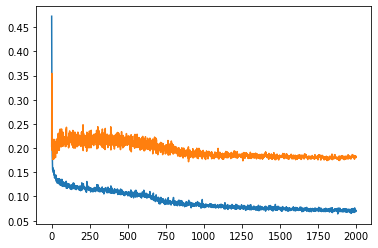

In [51]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [52]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_norm_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [53]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.10800670662057998


# Make predictions based on test set and get a root mean squared error 

In [54]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_norm_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [55]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.2299505518062788


# Plot train labels along with train predictions

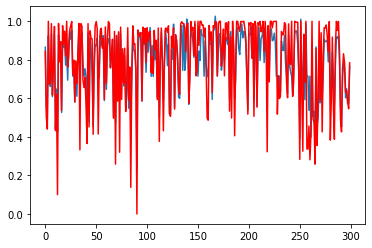

In [56]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

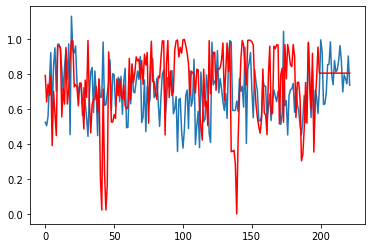

In [57]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [1]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [2]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [3]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [4]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [5]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [6]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [7]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [9]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [10]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [11]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [12]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [13]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [14]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [15]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [16]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [17]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [18]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [21]:
# Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
flat1 = tf.keras.layers.Flatten()(pool1)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
flat2 = tf.keras.layers.Flatten()(pool2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
flat3 = tf.keras.layers.Flatten()(pool3)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
flat4 = tf.keras.layers.Flatten()(pool4)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
flat5 = tf.keras.layers.Flatten()(pool5)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
flat6 = tf.keras.layers.Flatten()(pool6)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=10, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_weather_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_weather_model.summary())

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [22]:
from tensorflow import keras

multi_channel_cnn_weather_model.compile(loss='mae', optimizer='adam')

# Train model

In [23]:
history = multi_channel_cnn_weather_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 168.2632 - val_loss: 14.7292
Epoch 2/2000
10/10 - 0s - loss: 8.8060 - val_loss: 14.5403
Epoch 3/2000
10/10 - 0s - loss: 8.3794 - val_loss: 14.4165
Epoch 4/2000
10/10 - 0s - loss: 8.3622 - val_loss: 14.4484
Epoch 5/2000
10/10 - 0s - loss: 8.0459 - val_loss: 14.3231
Epoch 6/2000
10/10 - 0s - loss: 8.0875 - val_loss: 12.9117
Epoch 7/2000
10/10 - 0s - loss: 8.2919 - val_loss: 14.4495
Epoch 8/2000
10/10 - 0s - loss: 7.2857 - val_loss: 14.0536
Epoch 9/2000
10/10 - 0s - loss: 6.9803 - val_loss: 13.6974
Epoch 10/2000
10/10 - 0s - loss: 6.5859 - val_loss: 9.4505
Epoch 11/2000
10/10 - 0s - loss: 6.4544 - val_loss: 13.8564
Epoch 12/2000
10/10 - 0s - loss: 5.9976 - val_loss: 11.7024
Epoch 13/2000
10/10 - 0s - loss: 5.9327 - val_loss: 12.5955
Epoch 14/2000
10/10 - 0s - loss: 5.4908 - val_loss: 9.8893
Epoch 15/2000
10/10 - 0s - loss: 6.1586 - val_loss: 10.6570
Epoch 16/2000
10/10 - 0s - loss: 5.5146 - val_loss: 10.1105
Epoch 17/2000
10/10 - 0s - loss: 5.7752 - val_los

Epoch 139/2000
10/10 - 0s - loss: 1.2174 - val_loss: 4.8495
Epoch 140/2000
10/10 - 0s - loss: 0.6973 - val_loss: 7.1377
Epoch 141/2000
10/10 - 0s - loss: 1.1374 - val_loss: 5.6674
Epoch 142/2000
10/10 - 0s - loss: 0.8710 - val_loss: 6.2060
Epoch 143/2000
10/10 - 0s - loss: 0.6472 - val_loss: 5.0684
Epoch 144/2000
10/10 - 0s - loss: 0.5979 - val_loss: 5.5996
Epoch 145/2000
10/10 - 0s - loss: 0.8363 - val_loss: 6.1393
Epoch 146/2000
10/10 - 0s - loss: 0.6387 - val_loss: 4.9989
Epoch 147/2000
10/10 - 0s - loss: 0.5185 - val_loss: 5.1971
Epoch 148/2000
10/10 - 0s - loss: 0.5649 - val_loss: 4.8536
Epoch 149/2000
10/10 - 0s - loss: 0.7969 - val_loss: 4.7404
Epoch 150/2000
10/10 - 0s - loss: 0.9740 - val_loss: 4.8573
Epoch 151/2000
10/10 - 0s - loss: 1.0427 - val_loss: 7.2491
Epoch 152/2000
10/10 - 0s - loss: 0.9376 - val_loss: 4.6653
Epoch 153/2000
10/10 - 0s - loss: 0.6900 - val_loss: 5.2378
Epoch 154/2000
10/10 - 0s - loss: 0.9601 - val_loss: 4.5900
Epoch 155/2000
10/10 - 0s - loss: 1.0232

Epoch 276/2000
10/10 - 0s - loss: 1.2385 - val_loss: 4.3352
Epoch 277/2000
10/10 - 0s - loss: 0.9150 - val_loss: 6.5142
Epoch 278/2000
10/10 - 0s - loss: 0.7439 - val_loss: 4.9542
Epoch 279/2000
10/10 - 0s - loss: 0.6266 - val_loss: 6.7288
Epoch 280/2000
10/10 - 0s - loss: 0.6864 - val_loss: 4.5725
Epoch 281/2000
10/10 - 0s - loss: 0.6960 - val_loss: 6.1971
Epoch 282/2000
10/10 - 0s - loss: 0.6418 - val_loss: 4.8085
Epoch 283/2000
10/10 - 0s - loss: 0.8131 - val_loss: 6.4486
Epoch 284/2000
10/10 - 0s - loss: 0.6784 - val_loss: 5.1238
Epoch 285/2000
10/10 - 0s - loss: 0.6883 - val_loss: 5.5669
Epoch 286/2000
10/10 - 0s - loss: 0.7010 - val_loss: 4.6979
Epoch 287/2000
10/10 - 0s - loss: 0.5456 - val_loss: 5.0591
Epoch 288/2000
10/10 - 0s - loss: 0.4775 - val_loss: 5.0966
Epoch 289/2000
10/10 - 0s - loss: 0.8915 - val_loss: 4.6368
Epoch 290/2000
10/10 - 0s - loss: 0.6672 - val_loss: 5.3678
Epoch 291/2000
10/10 - 0s - loss: 0.5909 - val_loss: 5.4937
Epoch 292/2000
10/10 - 0s - loss: 0.6239

Epoch 413/2000
10/10 - 0s - loss: 0.4114 - val_loss: 4.8588
Epoch 414/2000
10/10 - 0s - loss: 0.3923 - val_loss: 5.2887
Epoch 415/2000
10/10 - 0s - loss: 0.5944 - val_loss: 5.0941
Epoch 416/2000
10/10 - 0s - loss: 0.5963 - val_loss: 4.7511
Epoch 417/2000
10/10 - 0s - loss: 0.5311 - val_loss: 4.9481
Epoch 418/2000
10/10 - 0s - loss: 0.6809 - val_loss: 4.6423
Epoch 419/2000
10/10 - 0s - loss: 0.5767 - val_loss: 5.6221
Epoch 420/2000
10/10 - 0s - loss: 0.4405 - val_loss: 5.0659
Epoch 421/2000
10/10 - 0s - loss: 0.5032 - val_loss: 4.7084
Epoch 422/2000
10/10 - 0s - loss: 0.4949 - val_loss: 5.0623
Epoch 423/2000
10/10 - 0s - loss: 0.6736 - val_loss: 5.8887
Epoch 424/2000
10/10 - 0s - loss: 0.5886 - val_loss: 4.2932
Epoch 425/2000
10/10 - 0s - loss: 0.6816 - val_loss: 4.4044
Epoch 426/2000
10/10 - 0s - loss: 0.5831 - val_loss: 4.8280
Epoch 427/2000
10/10 - 0s - loss: 0.5342 - val_loss: 4.9897
Epoch 428/2000
10/10 - 0s - loss: 0.4809 - val_loss: 4.9262
Epoch 429/2000
10/10 - 0s - loss: 0.5187

Epoch 550/2000
10/10 - 0s - loss: 0.4596 - val_loss: 5.2059
Epoch 551/2000
10/10 - 0s - loss: 0.3613 - val_loss: 4.7366
Epoch 552/2000
10/10 - 0s - loss: 0.3520 - val_loss: 4.9180
Epoch 553/2000
10/10 - 0s - loss: 0.3631 - val_loss: 5.0189
Epoch 554/2000
10/10 - 0s - loss: 0.3786 - val_loss: 5.1061
Epoch 555/2000
10/10 - 0s - loss: 0.4127 - val_loss: 4.5373
Epoch 556/2000
10/10 - 0s - loss: 0.5811 - val_loss: 4.8127
Epoch 557/2000
10/10 - 0s - loss: 0.3398 - val_loss: 5.1279
Epoch 558/2000
10/10 - 0s - loss: 0.3527 - val_loss: 4.9959
Epoch 559/2000
10/10 - 0s - loss: 0.3711 - val_loss: 5.0289
Epoch 560/2000
10/10 - 0s - loss: 0.3395 - val_loss: 5.1903
Epoch 561/2000
10/10 - 0s - loss: 0.4451 - val_loss: 4.8926
Epoch 562/2000
10/10 - 0s - loss: 0.3282 - val_loss: 4.9630
Epoch 563/2000
10/10 - 0s - loss: 0.3270 - val_loss: 5.1545
Epoch 564/2000
10/10 - 0s - loss: 0.4020 - val_loss: 4.2669
Epoch 565/2000
10/10 - 0s - loss: 0.6305 - val_loss: 4.6785
Epoch 566/2000
10/10 - 0s - loss: 0.3771

Epoch 687/2000
10/10 - 0s - loss: 0.3469 - val_loss: 4.9865
Epoch 688/2000
10/10 - 0s - loss: 0.3813 - val_loss: 5.1596
Epoch 689/2000
10/10 - 0s - loss: 0.3372 - val_loss: 4.8473
Epoch 690/2000
10/10 - 0s - loss: 0.3008 - val_loss: 5.2020
Epoch 691/2000
10/10 - 0s - loss: 0.3847 - val_loss: 4.6048
Epoch 692/2000
10/10 - 0s - loss: 0.4218 - val_loss: 4.9826
Epoch 693/2000
10/10 - 0s - loss: 0.3441 - val_loss: 5.2097
Epoch 694/2000
10/10 - 0s - loss: 0.4988 - val_loss: 5.4432
Epoch 695/2000
10/10 - 0s - loss: 0.4466 - val_loss: 4.6487
Epoch 696/2000
10/10 - 0s - loss: 0.4643 - val_loss: 4.6333
Epoch 697/2000
10/10 - 0s - loss: 0.3596 - val_loss: 5.3449
Epoch 698/2000
10/10 - 0s - loss: 0.4900 - val_loss: 5.3200
Epoch 699/2000
10/10 - 0s - loss: 0.3527 - val_loss: 4.8054
Epoch 700/2000
10/10 - 0s - loss: 0.3811 - val_loss: 4.6514
Epoch 701/2000
10/10 - 0s - loss: 0.3885 - val_loss: 4.8927
Epoch 702/2000
10/10 - 0s - loss: 0.4009 - val_loss: 5.0243
Epoch 703/2000
10/10 - 0s - loss: 0.3628

Epoch 824/2000
10/10 - 0s - loss: 0.3519 - val_loss: 4.7493
Epoch 825/2000
10/10 - 0s - loss: 0.4007 - val_loss: 4.9384
Epoch 826/2000
10/10 - 0s - loss: 0.3523 - val_loss: 4.9994
Epoch 827/2000
10/10 - 0s - loss: 0.3586 - val_loss: 4.8076
Epoch 828/2000
10/10 - 0s - loss: 0.3373 - val_loss: 4.7656
Epoch 829/2000
10/10 - 0s - loss: 0.4066 - val_loss: 4.6836
Epoch 830/2000
10/10 - 0s - loss: 0.4450 - val_loss: 5.0497
Epoch 831/2000
10/10 - 0s - loss: 0.4020 - val_loss: 5.0729
Epoch 832/2000
10/10 - 0s - loss: 0.3161 - val_loss: 4.7650
Epoch 833/2000
10/10 - 0s - loss: 0.3047 - val_loss: 4.7801
Epoch 834/2000
10/10 - 0s - loss: 0.3707 - val_loss: 4.8305
Epoch 835/2000
10/10 - 0s - loss: 0.2986 - val_loss: 5.0291
Epoch 836/2000
10/10 - 0s - loss: 0.3058 - val_loss: 4.9059
Epoch 837/2000
10/10 - 0s - loss: 0.3209 - val_loss: 5.0782
Epoch 838/2000
10/10 - 0s - loss: 0.3496 - val_loss: 5.1574
Epoch 839/2000
10/10 - 0s - loss: 0.2985 - val_loss: 5.0068
Epoch 840/2000
10/10 - 0s - loss: 0.3313

Epoch 961/2000
10/10 - 0s - loss: 0.3674 - val_loss: 4.8825
Epoch 962/2000
10/10 - 0s - loss: 0.3225 - val_loss: 5.0792
Epoch 963/2000
10/10 - 0s - loss: 0.3421 - val_loss: 4.8688
Epoch 964/2000
10/10 - 0s - loss: 0.3784 - val_loss: 4.5257
Epoch 965/2000
10/10 - 0s - loss: 0.4663 - val_loss: 4.6611
Epoch 966/2000
10/10 - 0s - loss: 0.3215 - val_loss: 4.9036
Epoch 967/2000
10/10 - 0s - loss: 0.3231 - val_loss: 4.8123
Epoch 968/2000
10/10 - 0s - loss: 0.3101 - val_loss: 4.7009
Epoch 969/2000
10/10 - 0s - loss: 0.2783 - val_loss: 4.8734
Epoch 970/2000
10/10 - 0s - loss: 0.3471 - val_loss: 4.3574
Epoch 971/2000
10/10 - 0s - loss: 0.4895 - val_loss: 4.4316
Epoch 972/2000
10/10 - 0s - loss: 0.3587 - val_loss: 5.0122
Epoch 973/2000
10/10 - 0s - loss: 0.3461 - val_loss: 4.9319
Epoch 974/2000
10/10 - 0s - loss: 0.2885 - val_loss: 4.7027
Epoch 975/2000
10/10 - 0s - loss: 0.3083 - val_loss: 4.6776
Epoch 976/2000
10/10 - 0s - loss: 0.2996 - val_loss: 4.5987
Epoch 977/2000
10/10 - 0s - loss: 0.3931

Epoch 1096/2000
10/10 - 0s - loss: 0.3234 - val_loss: 4.9487
Epoch 1097/2000
10/10 - 0s - loss: 0.3115 - val_loss: 5.0809
Epoch 1098/2000
10/10 - 0s - loss: 0.2568 - val_loss: 5.1225
Epoch 1099/2000
10/10 - 0s - loss: 0.3034 - val_loss: 5.3588
Epoch 1100/2000
10/10 - 0s - loss: 0.4349 - val_loss: 5.3438
Epoch 1101/2000
10/10 - 0s - loss: 0.3430 - val_loss: 5.0269
Epoch 1102/2000
10/10 - 0s - loss: 0.3947 - val_loss: 4.6247
Epoch 1103/2000
10/10 - 0s - loss: 0.3484 - val_loss: 5.0409
Epoch 1104/2000
10/10 - 0s - loss: 0.3163 - val_loss: 5.2271
Epoch 1105/2000
10/10 - 0s - loss: 0.3097 - val_loss: 5.2095
Epoch 1106/2000
10/10 - 0s - loss: 0.3083 - val_loss: 5.3176
Epoch 1107/2000
10/10 - 0s - loss: 0.3222 - val_loss: 5.1155
Epoch 1108/2000
10/10 - 0s - loss: 0.3162 - val_loss: 5.0681
Epoch 1109/2000
10/10 - 0s - loss: 0.3124 - val_loss: 4.8401
Epoch 1110/2000
10/10 - 0s - loss: 0.3404 - val_loss: 5.2445
Epoch 1111/2000
10/10 - 0s - loss: 0.3188 - val_loss: 5.0715
Epoch 1112/2000
10/10 - 

Epoch 1231/2000
10/10 - 0s - loss: 0.3392 - val_loss: 4.6852
Epoch 1232/2000
10/10 - 0s - loss: 0.3284 - val_loss: 4.8713
Epoch 1233/2000
10/10 - 0s - loss: 0.3017 - val_loss: 4.9706
Epoch 1234/2000
10/10 - 0s - loss: 0.2819 - val_loss: 4.8312
Epoch 1235/2000
10/10 - 0s - loss: 0.3202 - val_loss: 4.7084
Epoch 1236/2000
10/10 - 0s - loss: 0.3877 - val_loss: 4.6629
Epoch 1237/2000
10/10 - 0s - loss: 0.3705 - val_loss: 4.6918
Epoch 1238/2000
10/10 - 0s - loss: 0.3410 - val_loss: 4.7105
Epoch 1239/2000
10/10 - 0s - loss: 0.3925 - val_loss: 4.6790
Epoch 1240/2000
10/10 - 0s - loss: 0.3578 - val_loss: 4.7307
Epoch 1241/2000
10/10 - 0s - loss: 0.3357 - val_loss: 4.6617
Epoch 1242/2000
10/10 - 0s - loss: 0.3404 - val_loss: 4.5452
Epoch 1243/2000
10/10 - 0s - loss: 0.4773 - val_loss: 5.2216
Epoch 1244/2000
10/10 - 0s - loss: 0.2949 - val_loss: 5.3428
Epoch 1245/2000
10/10 - 0s - loss: 0.2515 - val_loss: 5.1628
Epoch 1246/2000
10/10 - 0s - loss: 0.2907 - val_loss: 5.2617
Epoch 1247/2000
10/10 - 

Epoch 1366/2000
10/10 - 0s - loss: 0.3139 - val_loss: 5.5191
Epoch 1367/2000
10/10 - 0s - loss: 0.3531 - val_loss: 5.3917
Epoch 1368/2000
10/10 - 0s - loss: 0.2402 - val_loss: 5.7065
Epoch 1369/2000
10/10 - 0s - loss: 0.3259 - val_loss: 5.6533
Epoch 1370/2000
10/10 - 0s - loss: 0.2861 - val_loss: 5.6640
Epoch 1371/2000
10/10 - 0s - loss: 0.3235 - val_loss: 5.4798
Epoch 1372/2000
10/10 - 0s - loss: 0.2958 - val_loss: 5.4310
Epoch 1373/2000
10/10 - 0s - loss: 0.2963 - val_loss: 5.4669
Epoch 1374/2000
10/10 - 0s - loss: 0.2548 - val_loss: 5.4331
Epoch 1375/2000
10/10 - 0s - loss: 0.3343 - val_loss: 5.3179
Epoch 1376/2000
10/10 - 0s - loss: 0.2589 - val_loss: 5.6082
Epoch 1377/2000
10/10 - 0s - loss: 0.3077 - val_loss: 5.5626
Epoch 1378/2000
10/10 - 0s - loss: 0.2961 - val_loss: 5.2600
Epoch 1379/2000
10/10 - 0s - loss: 0.2784 - val_loss: 4.9418
Epoch 1380/2000
10/10 - 0s - loss: 0.3566 - val_loss: 4.8985
Epoch 1381/2000
10/10 - 0s - loss: 0.3397 - val_loss: 5.3118
Epoch 1382/2000
10/10 - 

Epoch 1501/2000
10/10 - 0s - loss: 0.2875 - val_loss: 5.2874
Epoch 1502/2000
10/10 - 0s - loss: 0.3023 - val_loss: 5.2422
Epoch 1503/2000
10/10 - 0s - loss: 0.3026 - val_loss: 5.3638
Epoch 1504/2000
10/10 - 0s - loss: 0.2606 - val_loss: 5.4828
Epoch 1505/2000
10/10 - 0s - loss: 0.2918 - val_loss: 5.6299
Epoch 1506/2000
10/10 - 0s - loss: 0.2564 - val_loss: 5.7034
Epoch 1507/2000
10/10 - 0s - loss: 0.2823 - val_loss: 5.7617
Epoch 1508/2000
10/10 - 0s - loss: 0.2703 - val_loss: 5.6792
Epoch 1509/2000
10/10 - 0s - loss: 0.3304 - val_loss: 5.5667
Epoch 1510/2000
10/10 - 0s - loss: 0.3326 - val_loss: 5.4706
Epoch 1511/2000
10/10 - 0s - loss: 0.4887 - val_loss: 5.5985
Epoch 1512/2000
10/10 - 0s - loss: 0.5098 - val_loss: 6.2513
Epoch 1513/2000
10/10 - 0s - loss: 0.2921 - val_loss: 6.6294
Epoch 1514/2000
10/10 - 0s - loss: 0.2846 - val_loss: 7.0863
Epoch 1515/2000
10/10 - 0s - loss: 0.3008 - val_loss: 6.8945
Epoch 1516/2000
10/10 - 0s - loss: 0.3270 - val_loss: 6.5723
Epoch 1517/2000
10/10 - 

Epoch 1636/2000
10/10 - 0s - loss: 0.4826 - val_loss: 5.1485
Epoch 1637/2000
10/10 - 0s - loss: 0.4420 - val_loss: 5.6372
Epoch 1638/2000
10/10 - 0s - loss: 0.3921 - val_loss: 5.3156
Epoch 1639/2000
10/10 - 0s - loss: 0.3340 - val_loss: 4.9685
Epoch 1640/2000
10/10 - 0s - loss: 0.2634 - val_loss: 4.8586
Epoch 1641/2000
10/10 - 0s - loss: 0.2538 - val_loss: 5.2008
Epoch 1642/2000
10/10 - 0s - loss: 0.2543 - val_loss: 4.9306
Epoch 1643/2000
10/10 - 0s - loss: 0.2919 - val_loss: 4.9997
Epoch 1644/2000
10/10 - 0s - loss: 0.3104 - val_loss: 5.0043
Epoch 1645/2000
10/10 - 0s - loss: 0.2457 - val_loss: 5.1563
Epoch 1646/2000
10/10 - 0s - loss: 0.2981 - val_loss: 4.9235
Epoch 1647/2000
10/10 - 0s - loss: 0.2818 - val_loss: 4.7504
Epoch 1648/2000
10/10 - 0s - loss: 0.2787 - val_loss: 4.9181
Epoch 1649/2000
10/10 - 0s - loss: 0.2595 - val_loss: 5.0556
Epoch 1650/2000
10/10 - 0s - loss: 0.3215 - val_loss: 5.2139
Epoch 1651/2000
10/10 - 0s - loss: 0.2850 - val_loss: 5.3028
Epoch 1652/2000
10/10 - 

Epoch 1771/2000
10/10 - 0s - loss: 0.2477 - val_loss: 6.0403
Epoch 1772/2000
10/10 - 0s - loss: 0.2861 - val_loss: 5.8921
Epoch 1773/2000
10/10 - 0s - loss: 0.2765 - val_loss: 5.6800
Epoch 1774/2000
10/10 - 0s - loss: 0.3090 - val_loss: 5.7201
Epoch 1775/2000
10/10 - 0s - loss: 0.2562 - val_loss: 5.7853
Epoch 1776/2000
10/10 - 0s - loss: 0.2435 - val_loss: 5.6842
Epoch 1777/2000
10/10 - 0s - loss: 0.2328 - val_loss: 5.8787
Epoch 1778/2000
10/10 - 0s - loss: 0.2493 - val_loss: 5.9873
Epoch 1779/2000
10/10 - 0s - loss: 0.2866 - val_loss: 5.8279
Epoch 1780/2000
10/10 - 0s - loss: 0.2493 - val_loss: 5.8533
Epoch 1781/2000
10/10 - 0s - loss: 0.2525 - val_loss: 5.9825
Epoch 1782/2000
10/10 - 0s - loss: 0.2695 - val_loss: 5.7986
Epoch 1783/2000
10/10 - 0s - loss: 0.2346 - val_loss: 5.6942
Epoch 1784/2000
10/10 - 0s - loss: 0.2215 - val_loss: 5.5142
Epoch 1785/2000
10/10 - 0s - loss: 0.2722 - val_loss: 5.4035
Epoch 1786/2000
10/10 - 0s - loss: 0.2869 - val_loss: 5.4364
Epoch 1787/2000
10/10 - 

Epoch 1906/2000
10/10 - 0s - loss: 0.2779 - val_loss: 5.9113
Epoch 1907/2000
10/10 - 0s - loss: 0.2212 - val_loss: 5.7083
Epoch 1908/2000
10/10 - 0s - loss: 0.2598 - val_loss: 5.8596
Epoch 1909/2000
10/10 - 0s - loss: 0.2468 - val_loss: 5.6254
Epoch 1910/2000
10/10 - 0s - loss: 0.2637 - val_loss: 5.6746
Epoch 1911/2000
10/10 - 0s - loss: 0.2334 - val_loss: 5.4623
Epoch 1912/2000
10/10 - 0s - loss: 0.2473 - val_loss: 5.6593
Epoch 1913/2000
10/10 - 0s - loss: 0.2941 - val_loss: 5.6403
Epoch 1914/2000
10/10 - 0s - loss: 0.2774 - val_loss: 5.5631
Epoch 1915/2000
10/10 - 0s - loss: 0.2706 - val_loss: 5.5873
Epoch 1916/2000
10/10 - 0s - loss: 0.2486 - val_loss: 5.5639
Epoch 1917/2000
10/10 - 0s - loss: 0.2318 - val_loss: 5.3454
Epoch 1918/2000
10/10 - 0s - loss: 0.2792 - val_loss: 5.3008
Epoch 1919/2000
10/10 - 0s - loss: 0.2437 - val_loss: 5.4253
Epoch 1920/2000
10/10 - 0s - loss: 0.3138 - val_loss: 5.4915
Epoch 1921/2000
10/10 - 0s - loss: 0.2754 - val_loss: 5.7886
Epoch 1922/2000
10/10 - 

# Plot model loss and validation loss

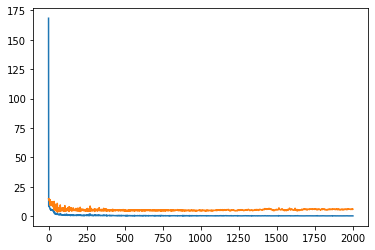

In [24]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [25]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_weather_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [26]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 3.8921156752989834


# Make predictions based on test set and get a root mean squared error 

In [27]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_weather_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [28]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 13.69001518648558


# Plot train labels along with train predictions

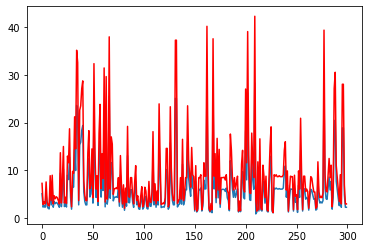

In [29]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

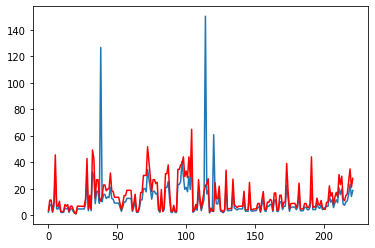

In [30]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [86]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [87]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [88]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [89]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [90]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [91]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [92]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [93]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [94]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [95]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [96]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [97]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [98]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [99]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [100]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Perform train test split for dataset

# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [101]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [102]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [103]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [104]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [105]:
# Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
flat1 = tf.keras.layers.Flatten()(pool1)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
flat2 = tf.keras.layers.Flatten()(pool2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
flat3 = tf.keras.layers.Flatten()(pool3)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
flat4 = tf.keras.layers.Flatten()(pool4)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
flat5 = tf.keras.layers.Flatten()(pool5)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
flat6 = tf.keras.layers.Flatten()(pool6)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=10, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_both_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_both_model.summary())

Model: "functional_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_20 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_21 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_22 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [106]:
from tensorflow import keras

multi_channel_cnn_both_model.compile(loss='mae', optimizer='adam')

# Train model

In [107]:
history = multi_channel_cnn_both_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 0.1572 - val_loss: 0.1447
Epoch 2/2000
10/10 - 0s - loss: 0.1375 - val_loss: 0.1514
Epoch 3/2000
10/10 - 0s - loss: 0.1222 - val_loss: 0.1461
Epoch 4/2000
10/10 - 0s - loss: 0.1215 - val_loss: 0.1515
Epoch 5/2000
10/10 - 0s - loss: 0.1132 - val_loss: 0.1415
Epoch 6/2000
10/10 - 0s - loss: 0.1138 - val_loss: 0.1440
Epoch 7/2000
10/10 - 0s - loss: 0.1062 - val_loss: 0.1457
Epoch 8/2000
10/10 - 0s - loss: 0.1039 - val_loss: 0.1449
Epoch 9/2000
10/10 - 0s - loss: 0.1004 - val_loss: 0.1442
Epoch 10/2000
10/10 - 0s - loss: 0.0961 - val_loss: 0.1443
Epoch 11/2000
10/10 - 0s - loss: 0.0964 - val_loss: 0.1441
Epoch 12/2000
10/10 - 0s - loss: 0.0962 - val_loss: 0.1439
Epoch 13/2000
10/10 - 0s - loss: 0.0907 - val_loss: 0.1476
Epoch 14/2000
10/10 - 0s - loss: 0.0946 - val_loss: 0.1464
Epoch 15/2000
10/10 - 0s - loss: 0.0905 - val_loss: 0.1445
Epoch 16/2000
10/10 - 0s - loss: 0.0947 - val_loss: 0.1459
Epoch 17/2000
10/10 - 0s - loss: 0.0916 - val_loss: 0.1426
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.0649 - val_loss: 0.1466
Epoch 141/2000
10/10 - 0s - loss: 0.0629 - val_loss: 0.1465
Epoch 142/2000
10/10 - 0s - loss: 0.0639 - val_loss: 0.1455
Epoch 143/2000
10/10 - 0s - loss: 0.0644 - val_loss: 0.1452
Epoch 144/2000
10/10 - 0s - loss: 0.0631 - val_loss: 0.1477
Epoch 145/2000
10/10 - 0s - loss: 0.0643 - val_loss: 0.1470
Epoch 146/2000
10/10 - 0s - loss: 0.0588 - val_loss: 0.1487
Epoch 147/2000
10/10 - 0s - loss: 0.0621 - val_loss: 0.1438
Epoch 148/2000
10/10 - 0s - loss: 0.0601 - val_loss: 0.1466
Epoch 149/2000
10/10 - 0s - loss: 0.0653 - val_loss: 0.1472
Epoch 150/2000
10/10 - 0s - loss: 0.0612 - val_loss: 0.1447
Epoch 151/2000
10/10 - 0s - loss: 0.0608 - val_loss: 0.1474
Epoch 152/2000
10/10 - 0s - loss: 0.0638 - val_loss: 0.1489
Epoch 153/2000
10/10 - 0s - loss: 0.0608 - val_loss: 0.1457
Epoch 154/2000
10/10 - 0s - loss: 0.0622 - val_loss: 0.1476
Epoch 155/2000
10/10 - 0s - loss: 0.0625 - val_loss: 0.1465
Epoch 156/2000
10/10 - 0s - loss: 0.0657

Epoch 277/2000
10/10 - 0s - loss: 0.0595 - val_loss: 0.1503
Epoch 278/2000
10/10 - 0s - loss: 0.0566 - val_loss: 0.1518
Epoch 279/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1503
Epoch 280/2000
10/10 - 0s - loss: 0.0585 - val_loss: 0.1517
Epoch 281/2000
10/10 - 0s - loss: 0.0565 - val_loss: 0.1541
Epoch 282/2000
10/10 - 0s - loss: 0.0596 - val_loss: 0.1499
Epoch 283/2000
10/10 - 0s - loss: 0.0581 - val_loss: 0.1520
Epoch 284/2000
10/10 - 0s - loss: 0.0592 - val_loss: 0.1497
Epoch 285/2000
10/10 - 0s - loss: 0.0573 - val_loss: 0.1527
Epoch 286/2000
10/10 - 0s - loss: 0.0578 - val_loss: 0.1521
Epoch 287/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1506
Epoch 288/2000
10/10 - 0s - loss: 0.0586 - val_loss: 0.1512
Epoch 289/2000
10/10 - 0s - loss: 0.0572 - val_loss: 0.1540
Epoch 290/2000
10/10 - 0s - loss: 0.0576 - val_loss: 0.1525
Epoch 291/2000
10/10 - 0s - loss: 0.0558 - val_loss: 0.1510
Epoch 292/2000
10/10 - 0s - loss: 0.0577 - val_loss: 0.1545
Epoch 293/2000
10/10 - 0s - loss: 0.0529

Epoch 414/2000
10/10 - 0s - loss: 0.0523 - val_loss: 0.1552
Epoch 415/2000
10/10 - 0s - loss: 0.0529 - val_loss: 0.1537
Epoch 416/2000
10/10 - 0s - loss: 0.0546 - val_loss: 0.1555
Epoch 417/2000
10/10 - 0s - loss: 0.0542 - val_loss: 0.1549
Epoch 418/2000
10/10 - 0s - loss: 0.0514 - val_loss: 0.1551
Epoch 419/2000
10/10 - 0s - loss: 0.0534 - val_loss: 0.1541
Epoch 420/2000
10/10 - 0s - loss: 0.0510 - val_loss: 0.1567
Epoch 421/2000
10/10 - 0s - loss: 0.0549 - val_loss: 0.1566
Epoch 422/2000
10/10 - 0s - loss: 0.0514 - val_loss: 0.1573
Epoch 423/2000
10/10 - 0s - loss: 0.0497 - val_loss: 0.1551
Epoch 424/2000
10/10 - 0s - loss: 0.0577 - val_loss: 0.1572
Epoch 425/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1574
Epoch 426/2000
10/10 - 0s - loss: 0.0480 - val_loss: 0.1584
Epoch 427/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1565
Epoch 428/2000
10/10 - 0s - loss: 0.0491 - val_loss: 0.1566
Epoch 429/2000
10/10 - 0s - loss: 0.0526 - val_loss: 0.1569
Epoch 430/2000
10/10 - 0s - loss: 0.0536

Epoch 551/2000
10/10 - 0s - loss: 0.0500 - val_loss: 0.1550
Epoch 552/2000
10/10 - 0s - loss: 0.0533 - val_loss: 0.1552
Epoch 553/2000
10/10 - 0s - loss: 0.0481 - val_loss: 0.1568
Epoch 554/2000
10/10 - 0s - loss: 0.0498 - val_loss: 0.1576
Epoch 555/2000
10/10 - 0s - loss: 0.0542 - val_loss: 0.1568
Epoch 556/2000
10/10 - 0s - loss: 0.0485 - val_loss: 0.1557
Epoch 557/2000
10/10 - 0s - loss: 0.0511 - val_loss: 0.1582
Epoch 558/2000
10/10 - 0s - loss: 0.0544 - val_loss: 0.1565
Epoch 559/2000
10/10 - 0s - loss: 0.0528 - val_loss: 0.1571
Epoch 560/2000
10/10 - 0s - loss: 0.0480 - val_loss: 0.1573
Epoch 561/2000
10/10 - 0s - loss: 0.0498 - val_loss: 0.1564
Epoch 562/2000
10/10 - 0s - loss: 0.0533 - val_loss: 0.1575
Epoch 563/2000
10/10 - 0s - loss: 0.0545 - val_loss: 0.1573
Epoch 564/2000
10/10 - 0s - loss: 0.0472 - val_loss: 0.1597
Epoch 565/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1579
Epoch 566/2000
10/10 - 0s - loss: 0.0574 - val_loss: 0.1581
Epoch 567/2000
10/10 - 0s - loss: 0.0506

Epoch 688/2000
10/10 - 0s - loss: 0.0491 - val_loss: 0.1561
Epoch 689/2000
10/10 - 0s - loss: 0.0495 - val_loss: 0.1563
Epoch 690/2000
10/10 - 0s - loss: 0.0507 - val_loss: 0.1573
Epoch 691/2000
10/10 - 0s - loss: 0.0485 - val_loss: 0.1568
Epoch 692/2000
10/10 - 0s - loss: 0.0502 - val_loss: 0.1564
Epoch 693/2000
10/10 - 0s - loss: 0.0475 - val_loss: 0.1574
Epoch 694/2000
10/10 - 0s - loss: 0.0490 - val_loss: 0.1578
Epoch 695/2000
10/10 - 0s - loss: 0.0469 - val_loss: 0.1580
Epoch 696/2000
10/10 - 0s - loss: 0.0473 - val_loss: 0.1594
Epoch 697/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1603
Epoch 698/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1591
Epoch 699/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1569
Epoch 700/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1576
Epoch 701/2000
10/10 - 0s - loss: 0.0489 - val_loss: 0.1566
Epoch 702/2000
10/10 - 0s - loss: 0.0483 - val_loss: 0.1563
Epoch 703/2000
10/10 - 0s - loss: 0.0464 - val_loss: 0.1579
Epoch 704/2000
10/10 - 0s - loss: 0.0498

Epoch 825/2000
10/10 - 0s - loss: 0.0475 - val_loss: 0.1571
Epoch 826/2000
10/10 - 0s - loss: 0.0477 - val_loss: 0.1582
Epoch 827/2000
10/10 - 0s - loss: 0.0469 - val_loss: 0.1587
Epoch 828/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1582
Epoch 829/2000
10/10 - 0s - loss: 0.0489 - val_loss: 0.1580
Epoch 830/2000
10/10 - 0s - loss: 0.0466 - val_loss: 0.1563
Epoch 831/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1559
Epoch 832/2000
10/10 - 0s - loss: 0.0472 - val_loss: 0.1592
Epoch 833/2000
10/10 - 0s - loss: 0.0497 - val_loss: 0.1598
Epoch 834/2000
10/10 - 0s - loss: 0.0484 - val_loss: 0.1574
Epoch 835/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1588
Epoch 836/2000
10/10 - 0s - loss: 0.0464 - val_loss: 0.1579
Epoch 837/2000
10/10 - 0s - loss: 0.0433 - val_loss: 0.1580
Epoch 838/2000
10/10 - 0s - loss: 0.0457 - val_loss: 0.1571
Epoch 839/2000
10/10 - 0s - loss: 0.0452 - val_loss: 0.1587
Epoch 840/2000
10/10 - 0s - loss: 0.0459 - val_loss: 0.1594
Epoch 841/2000
10/10 - 0s - loss: 0.0474

Epoch 962/2000
10/10 - 0s - loss: 0.0484 - val_loss: 0.1597
Epoch 963/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1607
Epoch 964/2000
10/10 - 0s - loss: 0.0475 - val_loss: 0.1605
Epoch 965/2000
10/10 - 0s - loss: 0.0453 - val_loss: 0.1607
Epoch 966/2000
10/10 - 0s - loss: 0.0490 - val_loss: 0.1604
Epoch 967/2000
10/10 - 0s - loss: 0.0428 - val_loss: 0.1603
Epoch 968/2000
10/10 - 0s - loss: 0.0475 - val_loss: 0.1617
Epoch 969/2000
10/10 - 0s - loss: 0.0438 - val_loss: 0.1627
Epoch 970/2000
10/10 - 0s - loss: 0.0484 - val_loss: 0.1620
Epoch 971/2000
10/10 - 0s - loss: 0.0454 - val_loss: 0.1599
Epoch 972/2000
10/10 - 0s - loss: 0.0500 - val_loss: 0.1597
Epoch 973/2000
10/10 - 0s - loss: 0.0456 - val_loss: 0.1597
Epoch 974/2000
10/10 - 0s - loss: 0.0439 - val_loss: 0.1621
Epoch 975/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1621
Epoch 976/2000
10/10 - 0s - loss: 0.0474 - val_loss: 0.1589
Epoch 977/2000
10/10 - 0s - loss: 0.0442 - val_loss: 0.1597
Epoch 978/2000
10/10 - 0s - loss: 0.0496

Epoch 1097/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1594
Epoch 1098/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1600
Epoch 1099/2000
10/10 - 0s - loss: 0.0450 - val_loss: 0.1607
Epoch 1100/2000
10/10 - 0s - loss: 0.0421 - val_loss: 0.1598
Epoch 1101/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1611
Epoch 1102/2000
10/10 - 0s - loss: 0.0461 - val_loss: 0.1608
Epoch 1103/2000
10/10 - 0s - loss: 0.0442 - val_loss: 0.1605
Epoch 1104/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1599
Epoch 1105/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1598
Epoch 1106/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1628
Epoch 1107/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1626
Epoch 1108/2000
10/10 - 0s - loss: 0.0451 - val_loss: 0.1596
Epoch 1109/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1603
Epoch 1110/2000
10/10 - 0s - loss: 0.0461 - val_loss: 0.1584
Epoch 1111/2000
10/10 - 0s - loss: 0.0499 - val_loss: 0.1615
Epoch 1112/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1626
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0428 - val_loss: 0.1617
Epoch 1233/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1603
Epoch 1234/2000
10/10 - 0s - loss: 0.0421 - val_loss: 0.1608
Epoch 1235/2000
10/10 - 0s - loss: 0.0420 - val_loss: 0.1627
Epoch 1236/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1637
Epoch 1237/2000
10/10 - 0s - loss: 0.0439 - val_loss: 0.1624
Epoch 1238/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1638
Epoch 1239/2000
10/10 - 0s - loss: 0.0465 - val_loss: 0.1635
Epoch 1240/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1614
Epoch 1241/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1602
Epoch 1242/2000
10/10 - 0s - loss: 0.0438 - val_loss: 0.1611
Epoch 1243/2000
10/10 - 0s - loss: 0.0439 - val_loss: 0.1593
Epoch 1244/2000
10/10 - 0s - loss: 0.0424 - val_loss: 0.1599
Epoch 1245/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1607
Epoch 1246/2000
10/10 - 0s - loss: 0.0453 - val_loss: 0.1620
Epoch 1247/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1632
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0447 - val_loss: 0.1617
Epoch 1368/2000
10/10 - 0s - loss: 0.0434 - val_loss: 0.1627
Epoch 1369/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1628
Epoch 1370/2000
10/10 - 0s - loss: 0.0459 - val_loss: 0.1634
Epoch 1371/2000
10/10 - 0s - loss: 0.0416 - val_loss: 0.1636
Epoch 1372/2000
10/10 - 0s - loss: 0.0439 - val_loss: 0.1630
Epoch 1373/2000
10/10 - 0s - loss: 0.0430 - val_loss: 0.1612
Epoch 1374/2000
10/10 - 0s - loss: 0.0421 - val_loss: 0.1609
Epoch 1375/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1627
Epoch 1376/2000
10/10 - 0s - loss: 0.0424 - val_loss: 0.1595
Epoch 1377/2000
10/10 - 0s - loss: 0.0450 - val_loss: 0.1609
Epoch 1378/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1609
Epoch 1379/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1609
Epoch 1380/2000
10/10 - 0s - loss: 0.0416 - val_loss: 0.1633
Epoch 1381/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1627
Epoch 1382/2000
10/10 - 0s - loss: 0.0460 - val_loss: 0.1618
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0431 - val_loss: 0.1626
Epoch 1503/2000
10/10 - 0s - loss: 0.0420 - val_loss: 0.1632
Epoch 1504/2000
10/10 - 0s - loss: 0.0435 - val_loss: 0.1638
Epoch 1505/2000
10/10 - 0s - loss: 0.0427 - val_loss: 0.1644
Epoch 1506/2000
10/10 - 0s - loss: 0.0456 - val_loss: 0.1635
Epoch 1507/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1627
Epoch 1508/2000
10/10 - 0s - loss: 0.0427 - val_loss: 0.1642
Epoch 1509/2000
10/10 - 0s - loss: 0.0414 - val_loss: 0.1646
Epoch 1510/2000
10/10 - 0s - loss: 0.0458 - val_loss: 0.1654
Epoch 1511/2000
10/10 - 0s - loss: 0.0435 - val_loss: 0.1660
Epoch 1512/2000
10/10 - 0s - loss: 0.0456 - val_loss: 0.1653
Epoch 1513/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1639
Epoch 1514/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1662
Epoch 1515/2000
10/10 - 0s - loss: 0.0421 - val_loss: 0.1665
Epoch 1516/2000
10/10 - 0s - loss: 0.0418 - val_loss: 0.1645
Epoch 1517/2000
10/10 - 0s - loss: 0.0434 - val_loss: 0.1609
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0421 - val_loss: 0.1635
Epoch 1638/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1647
Epoch 1639/2000
10/10 - 0s - loss: 0.0430 - val_loss: 0.1652
Epoch 1640/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1654
Epoch 1641/2000
10/10 - 0s - loss: 0.0417 - val_loss: 0.1664
Epoch 1642/2000
10/10 - 0s - loss: 0.0434 - val_loss: 0.1657
Epoch 1643/2000
10/10 - 0s - loss: 0.0418 - val_loss: 0.1643
Epoch 1644/2000
10/10 - 0s - loss: 0.0460 - val_loss: 0.1628
Epoch 1645/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1644
Epoch 1646/2000
10/10 - 0s - loss: 0.0434 - val_loss: 0.1642
Epoch 1647/2000
10/10 - 0s - loss: 0.0420 - val_loss: 0.1664
Epoch 1648/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1663
Epoch 1649/2000
10/10 - 0s - loss: 0.0411 - val_loss: 0.1661
Epoch 1650/2000
10/10 - 0s - loss: 0.0419 - val_loss: 0.1633
Epoch 1651/2000
10/10 - 0s - loss: 0.0451 - val_loss: 0.1637
Epoch 1652/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1646
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0397 - val_loss: 0.1651
Epoch 1773/2000
10/10 - 0s - loss: 0.0392 - val_loss: 0.1641
Epoch 1774/2000
10/10 - 0s - loss: 0.0417 - val_loss: 0.1648
Epoch 1775/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1651
Epoch 1776/2000
10/10 - 0s - loss: 0.0409 - val_loss: 0.1630
Epoch 1777/2000
10/10 - 0s - loss: 0.0418 - val_loss: 0.1637
Epoch 1778/2000
10/10 - 0s - loss: 0.0426 - val_loss: 0.1653
Epoch 1779/2000
10/10 - 0s - loss: 0.0406 - val_loss: 0.1651
Epoch 1780/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1646
Epoch 1781/2000
10/10 - 0s - loss: 0.0408 - val_loss: 0.1642
Epoch 1782/2000
10/10 - 0s - loss: 0.0408 - val_loss: 0.1623
Epoch 1783/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1630
Epoch 1784/2000
10/10 - 0s - loss: 0.0413 - val_loss: 0.1624
Epoch 1785/2000
10/10 - 0s - loss: 0.0405 - val_loss: 0.1636
Epoch 1786/2000
10/10 - 0s - loss: 0.0436 - val_loss: 0.1621
Epoch 1787/2000
10/10 - 0s - loss: 0.0392 - val_loss: 0.1601
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0451 - val_loss: 0.1648
Epoch 1908/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1647
Epoch 1909/2000
10/10 - 0s - loss: 0.0427 - val_loss: 0.1644
Epoch 1910/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1629
Epoch 1911/2000
10/10 - 0s - loss: 0.0440 - val_loss: 0.1664
Epoch 1912/2000
10/10 - 0s - loss: 0.0407 - val_loss: 0.1659
Epoch 1913/2000
10/10 - 0s - loss: 0.0428 - val_loss: 0.1645
Epoch 1914/2000
10/10 - 0s - loss: 0.0411 - val_loss: 0.1644
Epoch 1915/2000
10/10 - 0s - loss: 0.0424 - val_loss: 0.1638
Epoch 1916/2000
10/10 - 0s - loss: 0.0419 - val_loss: 0.1619
Epoch 1917/2000
10/10 - 0s - loss: 0.0428 - val_loss: 0.1644
Epoch 1918/2000
10/10 - 0s - loss: 0.0416 - val_loss: 0.1643
Epoch 1919/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1651
Epoch 1920/2000
10/10 - 0s - loss: 0.0419 - val_loss: 0.1643
Epoch 1921/2000
10/10 - 0s - loss: 0.0410 - val_loss: 0.1630
Epoch 1922/2000
10/10 - 0s - loss: 0.0421 - val_loss: 0.1620
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

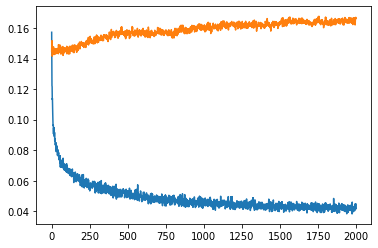

In [108]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [109]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_both_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [110]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.07578616116909186


# Make predictions based on test set and get a root mean squared error 

In [111]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_both_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [112]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.2371768157649228


# Plot train labels along with train predictions

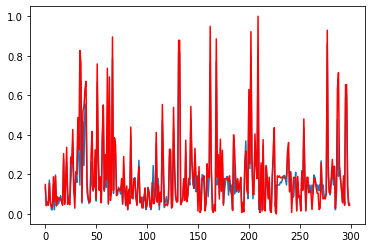

In [113]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

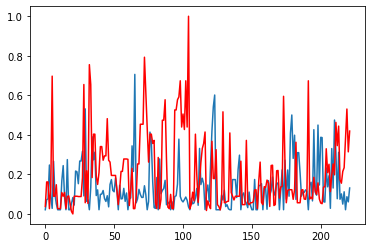

In [114]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()